## Processing of occurrence Data (Cleaning - Removing duplicates)

<p style='text-align: justify;'>Removal of duplicated records in occurrence data is very important in data processing. Data from the same location may be updated by multiple researchers or by fortuitously. In that case, occurrences are considered as duplicate when multiple occurrences are found at same locations (longitude and latitude). The process we have already done in Alty_page_1.ipynb, also you can find out here using the following code:</p>

First you need to import required libraries.

In [1]:
import numpy as np
import pandas as pd
from shapely.geometry import Point, Polygon, MultiPolygon, MultiPoint
import geopandas as gpd
from fiona.crs import from_epsg
import matplotlib.pyplot as plt
import osmnx as ox
from descartes import PolygonPatch
from shapely.ops import cascaded_union

<p style='text-align: justify;'>Next to begin with the processing of data, we need files which contains data. There are two shapefiles which we are going to use. One contains data with geometry as points, the file we saved in last page with name - <i>alty_gbif_process.shp</i> and other is going to use as a base for the data containing points as geometry where the base file -<i>TM_WORLD_BORDERS_SIMPL-0.2.shp</i> has geometry as polygons. </p> 

The following code help us to understand the role of duplicated data.

In [2]:
alty_gbif=gpd.read_file('alty_gbif_process.shp') 
len(alty_gbif)

5058

Text(76.0, 0.5, 'Latitude')

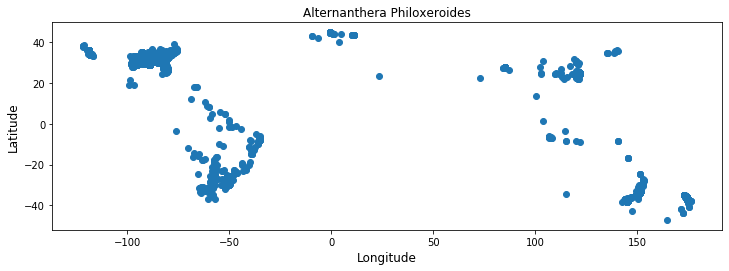

In [3]:
alty_gbif=gpd.read_file('alty_gbif_process.shp') 
wrld_simpl=gpd.read_file('TM_WORLD_BORDERS_SIMPL-0.2.shp') 
## duplicated rows of lon-lat columns for South America
dups = alty_gbif.duplicated(subset =('lon','lat'))
# total no. of duplicates
sum(dups) 
# dropping duplicated rows
alty_gbif = alty_gbif.drop_duplicates(subset =('lon','lat'), inplace = False)
# Setting index
alty_gbif=alty_gbif.set_index([pd.Index(np.arange(0,len(alty_gbif)))]) 
alty_gbif.plot(figsize=(12,8))
plt.title('Alternanthera Philoxeroides', fontsize =12)
plt.xlabel('Longitude', size =12)
plt.ylabel('Latitude', size =12)

After removing duplicated rows from data, we will store it in *.shp* file to use the processed data in future.

In [4]:
len(alty_gbif)

5058

In [5]:
alty_gbif.crs = wrld_simpl.crs
alty_gbif.to_file('alty_gbif_process.shp')

Plot of the processed data

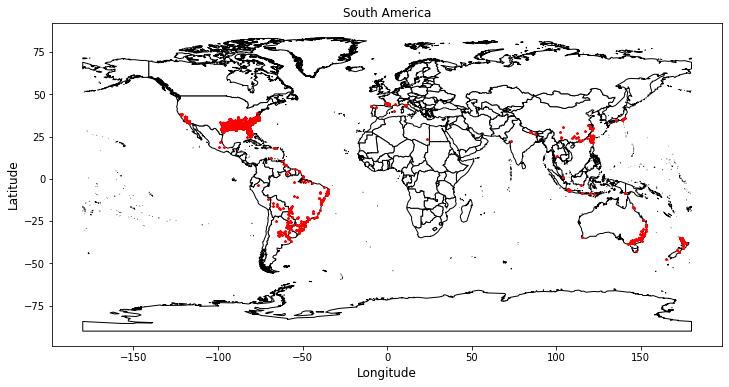

In [6]:
base = wrld_simpl.plot(color ='white', edgecolor ='black',figsize =(12,8)) 
plt.title('South America', fontsize =12)
plt.xlabel('Longitude', size =12)
plt.ylabel('Latitude', size =12)
alty_gbif.plot(ax=base, marker ='*', color ='red', markersize =5,
figsize =(12,8));

##  Processing of occurrence Data (Cleaning - Points falling over ocean)

<p style='text-align: justify;'>In this section, we remove the occurrences that fall into the ocean from the partially cleaned data (after removing the duplicates). Ocean regions are not described by polygons, it is actually blank surface in World map. And <code>GeoDataFrame</code> <i>alty_gbif</i> contain geometry as points where occurrence are located based on their longitude and latitude values. We combine shapefile with world map data which contains polygons as geometry and <code>GeoDataFrame</code> <i>alty_gbif</i> which contains points as geometry, by their spatial join in the following code using module <code>sjoin</code> of library <code>geopandas</code>. The datasets are combined based on their spatial relationship to one another. Two geometry objects are merged based on their spatial relationship to one another. Then the intersection part of polygons and points come out as point data. The method <code>op</code> from module <code>sjoin</code> determines the type of join operation to apply. <code>op</code> can be set to <code>intersects</code>, <code>within</code> or <code>contains</code>. The data is joined based on points to polygons. Here we do not need to clear the data falls in ocean as the following code provides the occurrence of data on land. The combined data to be saved in shape file.</p>

In [7]:
wrld_simpl.crs # coordinate reference system

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Text(76.0, 0.5, 'Latitude')

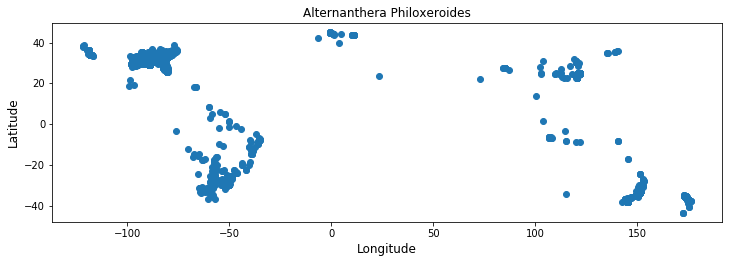

In [8]:
# sjoin a module of geopandas joining data based on spatial relationship.
alty_gbif_oc = gpd.sjoin(alty_gbif, wrld_simpl, how='inner', op='intersects',lsuffix ='left', rsuffix ='right') 
alty_gbif_oc.crs=wrld_simpl.crs # setting crs
alty_gbif_oc.to_file('alty_gbif_oc.shp')
alty_gbif_oc=gpd.read_file('alty_gbif_oc.shp')
alty_gbif_oc.plot(figsize=(12,8))
plt.title('Alternanthera Philoxeroides', fontsize =12)
plt.xlabel('Longitude', size =12)
plt.ylabel('Latitude', size =12)

In [9]:
len(alty_gbif_oc)

4788

In [10]:
alty_gbif_oc.crs=wrld_simpl.crs
alty_gbif_oc.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Plot of the processed data.

See the difference on this map and last map. You will find data points are present only on the land surface not on the ocean surface.

Text(75.875, 0.5, 'Latitude')

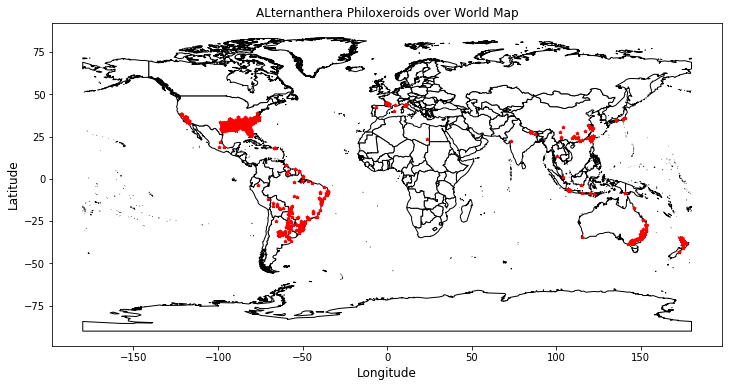

In [11]:
base = wrld_simpl.plot(color ='white', edgecolor ='black', figsize =(12,8))
alty_gbif_oc.plot(ax=base, marker ='*', color ='red', markersize =10, figsize =(12,8))
plt.title('ALternanthera Philoxeroids over World Map', fontsize =12)
plt.xlabel('Longitude', size =12)
plt.ylabel('Latitude', size =12)

Text(75.875, 0.5, 'Latitude')

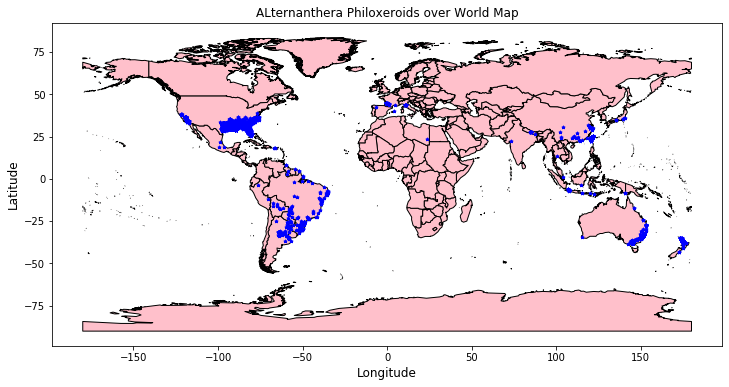

In [12]:
base = wrld_simpl.plot(color ='pink', edgecolor ='black', figsize =(12,8))
alty_gbif_oc.plot(ax=base, marker ='*', color ='blue', markersize =10, figsize =(12,8))
plt.title('ALternanthera Philoxeroids over World Map', fontsize =12)
plt.xlabel('Longitude', size =12)
plt.ylabel('Latitude', size =12)

## DBSCAN

DBSCAN Density-based spatial clustering of applications with noise is a data clustering algorithm proposed by Martin Ester, Hans-Peter Kriegel, Jorg Sander and Xiaowei Xu in 1996.

* It is density-based clustering non-parametric algorithm: given a set of points in some space, it groups together points that are closely packed together (points with many nearby neighbors) 

DBSCAN Density-based spatial clustering of applications with noise DBSCAN is a well-known data clustering algorithm that is commonly used in data mining and machine learning.

Based on a set of points (let's consider a bidimensional space), DBSCAN groups together points that are close to each other based on a distance measurement (usually Euclidean distance) and a minimum number of points. It also marks as outliers the points that are in low-density regions.

In [13]:
alty_gbif_oc[['lon','lat']]

,lon,lat
0,174.705837,-36.917413
1,174.716184,-36.913442
2,174.711226,-36.926905
3,174.721018,-36.919310
4,174.689445,-36.930311
...,...,...
4783,-76.333333,-3.333333
4784,100.583333,13.750000
4785,-54.657287,5.797428
4786,103.800000,1.366700


In [14]:
from sklearn.cluster import DBSCAN

In [15]:
db=DBSCAN(eps=10, min_samples=10).fit(alty_gbif_oc[['lon','lat']])
labels=db.labels_
print(labels)
alty_gbif_oc['clust_db']=labels

[ 0  0  0 ...  5  8 -1]


In [16]:
alty_gbif_oc.head()

,species,lon,lat,index_righ,FIPS,ISO2,ISO3,UN,NAME,AREA,POP2005,REGION,SUBREGION,LON_1,LAT_1,geometry,clust_db
0,Alternanthera philoxeroides,174.705837,-36.917413,159,NZ,NZ,NZL,554,New Zealand,26799,4097112,9,53,172.235,-42.634,POINT (174.70584 -36.91741),0
1,Alternanthera philoxeroides,174.716184,-36.913442,159,NZ,NZ,NZL,554,New Zealand,26799,4097112,9,53,172.235,-42.634,POINT (174.71618 -36.91344),0
2,Alternanthera philoxeroides,174.711226,-36.926905,159,NZ,NZ,NZL,554,New Zealand,26799,4097112,9,53,172.235,-42.634,POINT (174.71123 -36.92690),0
3,Alternanthera philoxeroides,174.721018,-36.919310,159,NZ,NZ,NZL,554,New Zealand,26799,4097112,9,53,172.235,-42.634,POINT (174.72102 -36.91931),0
4,Alternanthera philoxeroides,174.689445,-36.930311,159,NZ,NZ,NZL,554,New Zealand,26799,4097112,9,53,172.235,-42.634,POINT (174.68945 -36.93031),0


In [17]:
np.unique(labels)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8], dtype=int64)

All clusters are identified by their numbers from -1 to 8. Their are total 9 clusters and noise points are identified by -1.

In [19]:
alty_gbif_oc[alty_gbif_oc['clust_db']==-1].geometry  ## Noise points

4437    POINT (115.07333 -34.18972)
4721     POINT (140.40500 -8.52000)
4722     POINT (140.40639 -8.52028)
4723     POINT (140.42500 -8.52670)
4737     POINT (139.39055 35.35744)
4738     POINT (140.20833 36.07694)
4739     POINT (135.53742 34.73365)
4740     POINT (139.35881 35.50644)
4741     POINT (139.31556 35.54075)
4742     POINT (140.64880 35.86778)
4743     POINT (135.31570 34.87787)
4744     POINT (135.38300 34.78330)
4745      POINT (73.10300 22.32000)
4777     POINT (-66.46936 18.22250)
4778     POINT (-67.13962 18.20107)
4779     POINT (-66.15801 18.14602)
4783     POINT (-76.33333 -3.33333)
4784     POINT (100.58333 13.75000)
4787      POINT (23.63333 23.56667)
Name: geometry, dtype: geometry

In [20]:
if -1 in labels:
    clust_num=len(set(labels))-1
else:
    clust_num=len(set(labels))

In [21]:
clusters=[]
mcp_points=[]
polygon=[]
for i in range(clust_num):
    clust=alty_gbif_oc[alty_gbif_oc['clust_db']==i]
    clusters.append(clust)
    Points=MultiPoint(list(alty_gbif_oc['geometry'][alty_gbif_oc['clust_db']==i]))
    mcp_points.append(Points)
    cnvx_hl= Points.convex_hull
    poly=list(cnvx_hl.exterior.coords)
    polygn=Polygon(poly)
    polygon.append(polygn)

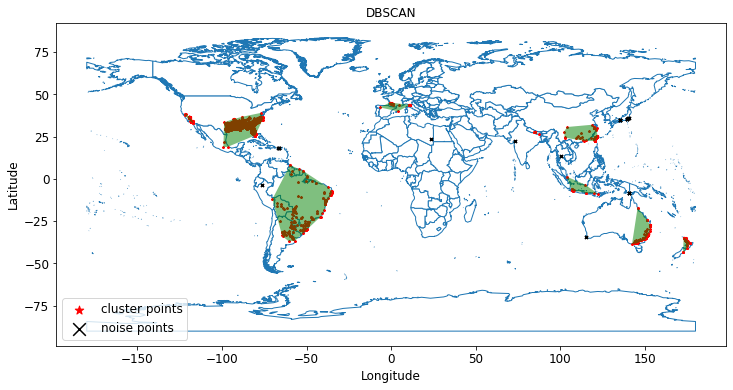

In [22]:
poly=gpd.GeoSeries(polygon)
df=gpd.GeoDataFrame({'geometry': polygon, 'df':[0,1,2,3,4,5,6,7,8]}, crs=wrld_simpl.crs)
ax=wrld_simpl.plot(color='white', edgecolor='tab:blue',linewidth=1, figsize=(12,8))
alty_gbif_oc[alty_gbif_oc['clust_db']!=-1].plot(ax=ax, marker='*', label='cluster points', color='red', markersize=5)
alty_gbif_oc[alty_gbif_oc['clust_db']==-1].plot(ax=ax, marker='x', label='noise points', color='black', markersize=10)
df.plot(ax=ax, color='green', alpha=0.5)
plt.title('DBSCAN', fontsize=12)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(loc='lower left', fontsize=12, markerscale=4)
plt.savefig('dbscan_mcp_ol.jpg', dpi=500)

Extracting only occurrences which are present inside the clusters and eliminating noise points from data.

In [23]:
alty_gbif_mcp = gpd.sjoin(alty_gbif_oc, df, how='inner', op='intersects',lsuffix ='left', rsuffix ='right') 

In [24]:
len(alty_gbif_mcp)

4769

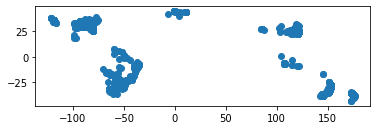

In [25]:
alty_gbif_mcp.plot()

In [26]:
alty_gbif_mcp.crs=from_epsg(4326)

E:\spatial\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [27]:
alty_gbif_mcp.to_file('alty_gbif_mcp.shp')

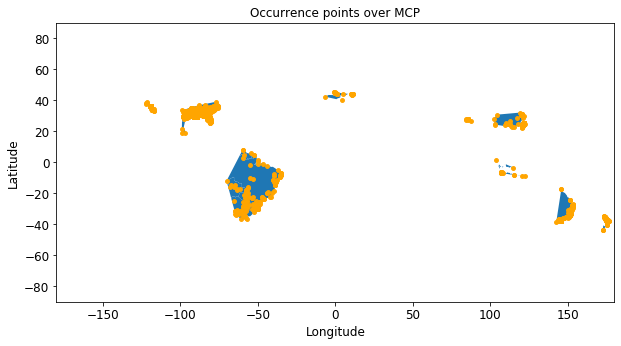

In [29]:
cvx=gpd.overlay(wrld_simpl,df, how='intersection')
ay=cvx.plot(figsize=(10,8))
alty_gbif_mcp.plot(ax=ay, marker='o', color='orange', markersize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlim(-180,180)
plt.ylim(-90,90)
plt.title('Occurrence points over MCP', fontsize=12)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.savefig('MCP_ol.jpeg')

In [30]:
alty_mcp_polygons=cvx
alty_mcp_polygons.crs=from_epsg(4326)
alty_mcp_polygons.to_file('alty_mcp_polygons.shp')

E:\spatial\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


## Processing of occurrence Data (Cleaning - geographic bias)

<p style='text-align: justify;'>A critical issue while dealing with the presence-only data is the presence of <b>sample selection bias</b>. It is often observed that the investigator visits the areas for sample collection which are either geographically convenient or environmental-friendly. This gives rise to two different categories of sample selection bias, one occurs in the geographic space and the other in environmental space. For the current <i>Alternanthera Philoxeroides</i> data, we shall deal with both types of bias. Using the following piece of code, we shall remove the geographic bias from the sample. The idea is similar to the concept of fishet in ArcGIS. We shall divide the whole region into small grids of a certain resolution and from each grid, we shall select one occurrence point only. The choice of grid size is subjective in nature and will vary for different problems. Note that, we have extended the raster to take care of points that fall within the boundary of the extent we are studying. In code, match the list. Grid cells over the polygons of shape file are collected in this list. From datasets with geometry as points, single points from each grid cell are randomly selected and added it to DataFrame. Points to be noted is that subsampling reduces the number of records, and it cannot correct the data for areas that have not been sampled at all. It suffers from the problem that locally dense records might be a true reflection of the relative suitable of habitat. In first we Plotted all polygons seperately. As in World Map, all countries are represented by their geometry as polygons. Next, All polygons have been joined based on their coordinates and single polygon has been created. Basically, it works in the way, that all individual polygons are placed over the plane surface and from that plane surface you are getting the union of all individual polygons that you have placed onto the plane surface. In the following code, this process is done by the method <code>cascaded_union</code> from module <code>ops</code>which is imported from library <code>Shapely</code>. Grid cells are created over the extracted polygon using <code>quadrat_cut_geometry</code> module of package <code>osmnx</code>. Whole region is divided into small grid cells. A single occurrence species is collected from each grid cell. Then the data have been saved in shape file with extention <i>.shp</i>.</p>

In [2]:
alty_gbif_mcp=gpd.read_file('alty_gbif_mcp.shp')
alty_mcp_polygons=gpd.read_file('alty_mcp_polygons.shp')
wrld_simpl=gpd.read_file('TM_WORLD_BORDERS_SIMPL-0.2.shp') 

Name of the countries in array where Alternanthera Philoxeroides are present.

In [3]:
np.unique(alty_mcp_polygons['NAME'])

array(['Andorra', 'Argentina', 'Australia', 'Bolivia', 'Brazil', 'Chile',
       'China', 'France', 'French Guiana', 'Guyana', 'Indonesia', 'Italy',
       'Mexico', 'Monaco', 'Nepal', 'New Zealand', 'Paraguay', 'Peru',
       'Singapore', 'Spain', 'Suriname', 'Taiwan', 'United States',
       'Uruguay', 'Venezuela'], dtype=object)

In [4]:
np.unique(alty_gbif_mcp['NAME'])

array(['Argentina', 'Australia', 'Bolivia', 'Brazil', 'China', 'France',
       'French Guiana', 'Guyana', 'Indonesia', 'Italy', 'Mexico', 'Nepal',
       'New Zealand', 'Paraguay', 'Peru', 'Singapore', 'Spain',
       'Suriname', 'Taiwan', 'United States'], dtype=object)

I will create copy of alty_gbif_wrld in another <code>GeoDataFrame</code> and use it in further analysis. One can also use the object <code>alty_gbif_wrld</code>

In [5]:
alty_gbif=alty_mcp_polygons
length=len(alty_gbif)

Index have been setup to the data so that in future use, their will not be any problem related to index.

In [6]:
alty_gbif=alty_gbif.set_index([pd.Index(np.arange(0,length))])
alty_gbif.head()

,FIPS,ISO2,ISO3,UN,NAME,AREA,POP2005,REGION,SUBREGION,LON,LAT,df,geometry
0,AR,AR,ARG,32,Argentina,273669,38747148,19,5,-65.167,-35.377,5,POLYGON ((-65.74806200000003 -22.1116679999999...
1,BL,BO,BOL,68,Bolivia,108438,9182015,19,5,-64.671,-16.715,5,POLYGON ((-65.19020099999997 -22.0947300000000...
2,BR,BR,BRA,76,Brazil,845942,186830759,19,5,-53.089,-10.772,5,(POLYGON ((-60.09833526611328 5.21722221374511...
3,CI,CL,CHL,152,Chile,74880,16295102,19,5,-69.433,-23.389,5,POLYGON ((-67.35784534570949 -22.8232735867524...
4,FG,GF,GUF,254,French Guiana,8815,192099,19,5,-53.241,3.924,5,POLYGON ((-52.26558539445175 4.888836039993743...


<p style='text-align: justify;'>In the following code, <code>geom</code> is the column <code>geometry</code> in <code>GeoDataFrame</code> with name <code>alty_gbif</code>. And there are polygons in all the row of geometry. So <code>isinstance</code> in the code is checking that if values in rows of column <code>geometry</code> is polygon or not. And if the condition satisfies, then Multipolygon will be created using all the Polygons.</p>

In [7]:
geom=alty_gbif['geometry']
if isinstance(geom, Polygon):
    geom=MultiPolygon([geom])
#print(geom)

In [8]:
mylist=[]
for i in range(len(alty_gbif)):
    g=alty_gbif.geometry.values[i]
    mylist.append([g])
#print(mylist)

In [9]:
myGeomList = [x[0] for x in mylist]
#print(myGeomList)

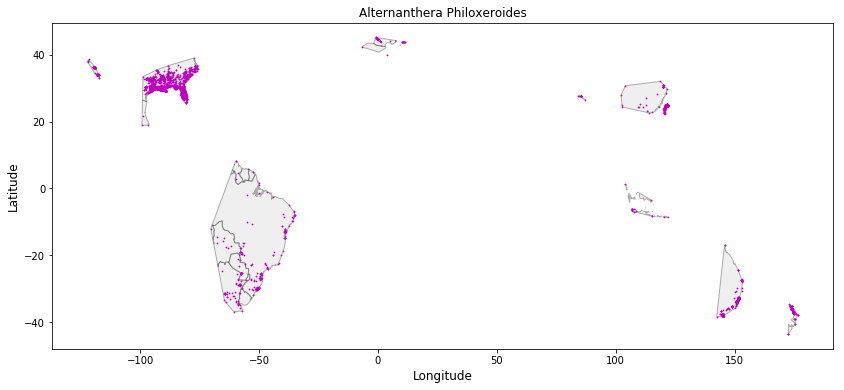

In [10]:
# plot the cut-up city
fig, ax = plt.subplots(figsize=(14,6))
for polygon in geom:
    patch = PolygonPatch(polygon, fc='#cccccc', ec='k', alpha=0.3, zorder=1)
    ax.add_patch(patch)
ax.scatter(x=alty_gbif_mcp['lon'], y=alty_gbif_mcp['lat'], s=3, c='m', linewidth=0, zorder=2)

ax.axis('on')

plt.title('Alternanthera Philoxeroides', fontsize =12)
plt.xlabel('Longitude', size =12)
plt.ylabel('Latitude', size =12)
plt.show()

<p style='text-align: justify;'>Using <code>cascaded_union</code> all the polygons will be joined and created as single polygon. So using <code>cascaded_union</code> polygons of all countries will be joined and form a single polygon.</p>

In [11]:
cu = cascaded_union(myGeomList)

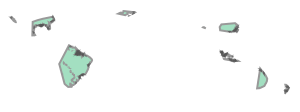

In [12]:
cu

<p style='text-align: justify;'>Using the module <code>quadrat_cut_geometry</code> in library <code>osmnx</code>, gridcells will be created using geometry of joined polygons over the land.</p>

In [13]:
geometry_cut = ox.quadrat_cut_geometry(cu, quadrat_width =0.2)
geometry_cut

In [2]:
import osmnx as ox
help(ox.quadrat_cut_geometry)

Help on function quadrat_cut_geometry in module osmnx.core:

quadrat_cut_geometry(geometry, quadrat_width, min_num=3, buffer_amount=1e-09)
    Split a Polygon or MultiPolygon up into sub-polygons of a specified size,
    using quadrats.
    
    Parameters
    ----------
    geometry : shapely Polygon or MultiPolygon
        the geometry to split up into smaller sub-polygons
    quadrat_width : numeric
        the linear width of the quadrats with which to cut up the geometry (in
        the units the geometry is in)
    min_num : int
        the minimum number of linear quadrat lines (e.g., min_num=3 would
        produce a quadrat grid of 4 squares)
    buffer_amount : numeric
        buffer the quadrat grid lines by quadrat_width times buffer_amount
    
    Returns
    -------
    shapely MultiPolygon



In [14]:
geom_cut=pd.DataFrame({'geom_cut':[geometry_cut]})

In [15]:
geom_cut.to_csv('geom_cut.csv')

In [16]:
geom_ct=pd.DataFrame({'geom_cut':geometry_cut})
geom_ct.to_csv('geom_ct.csv')

In [17]:
help(ox.quadrat_cut_geometry)

Help on function quadrat_cut_geometry in module osmnx.core:

quadrat_cut_geometry(geometry, quadrat_width, min_num=3, buffer_amount=1e-09)
    Split a Polygon or MultiPolygon up into sub-polygons of a specified size,
    using quadrats.
    
    Parameters
    ----------
    geometry : shapely Polygon or MultiPolygon
        the geometry to split up into smaller sub-polygons
    quadrat_width : numeric
        the linear width of the quadrats with which to cut up the geometry (in
        the units the geometry is in)
    min_num : int
        the minimum number of linear quadrat lines (e.g., min_num=3 would
        produce a quadrat grid of 4 squares)
    buffer_amount : numeric
        buffer the quadrat grid lines by quadrat_width times buffer_amount
    
    Returns
    -------
    shapely MultiPolygon



### Plot of the gridcells over the SouthAmerica

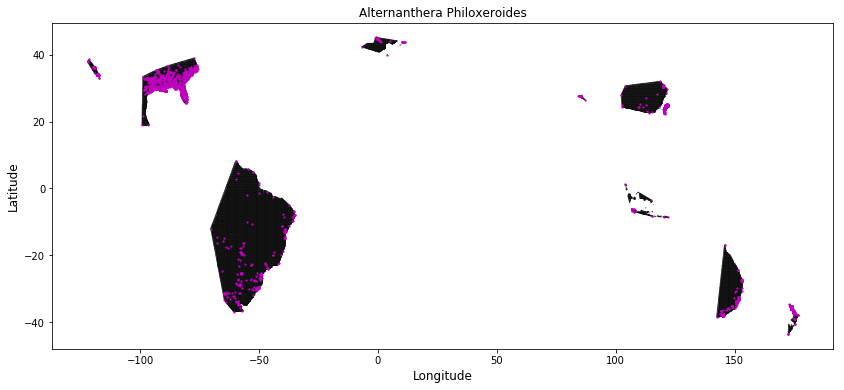

In [18]:
# plot the city with gridcells created on it
fig, ax = plt.subplots(figsize=(14,6))
for polygon in geometry_cut:
    patch = PolygonPatch(polygon, fc='#cccccc', ec='k', alpha=0.5, zorder=1)
    ax.add_patch(patch)
ax.scatter(x=alty_gbif_mcp['lon'], y=alty_gbif_mcp['lat'], s=5, c='m', linewidth=0, zorder=2)
    
#ax.set_xlim(west, east)
#ax.set_ylim(south, north)
ax.axis('on')

plt.title('Alternanthera Philoxeroides', fontsize =12)
plt.xlabel('Longitude', size =12)
plt.ylabel('Latitude', size =12)
plt.show()

Now Using the following codes, list is created from the polygons of all gridcells.

In [19]:
asw=[] # creating list of the polygons of all gridcells.
for polygons in geometry_cut:
    asw.append(polygons)

In [20]:
polyg_list=pd.DataFrame({'polygon':asw})
polyg_list.to_csv('polyg_list.csv')

<p style='text-align: justify;'>Here using module <code>GeoDataFrame</code> of library <code>Geopandas</code>, <code>GeoDataFrame</code> is created of each polygons present in <code>list</code> of the polygons of all gridcells. </p> 

In [21]:
aswd=[] #
for i in range(len(asw)):
    aw=gpd.GeoSeries([asw[i]])
    az=pd.DataFrame({'geometry':aw, 'df':[1]})
    crs={'init': 'epsg:4326'}
    df=gpd.GeoDataFrame(az.df,crs=crs, geometry=az.geometry)
    aswd.append(df)

In [22]:
gframe=pd.DataFrame({'aswd':aswd})
gframe.to_csv('gframe.csv')

<p style='text-align: justify;'>Using the module <code>sjoin</code> from library <code>Geopandas</code>, taking out the intersection part of <code>alty_gbif_mpc</code> (data containing Species corresponding to their locations) with each <code>GeoDataFrame</code> created in the <code>list</code> of <code>aswd</code>. Then the <code>list</code> is created for the <code>GeoDataFrame</code> of the intersection part.</p>

In [23]:
qwa=[]
for i in range(len(aswd)):
    alty_gbif_mcp.crs = {'init': 'epsg:4326'}
    qw= gpd.sjoin(alty_gbif_mcp, aswd[i], how='inner', op='intersects')
    qwa.append(qw)

In [24]:
intersc=pd.DataFrame({'qwa':qwa})
intersc.to_csv('intersc.csv')

<p style='text-align: justify;'>As you can see in the plot of gridcells. There are occurrence species located inside some of the gridcells and other gridcells has no occurrence species in them. So the <code>present</code> represent list of gridcells which contains species and <code>npresent</code> represent the list of gridcells which does not contain species.</p>

In [25]:
present=[]
npresent=[]
for i in range(len(aswd)):
    if len(qwa[i])==0:
        npresent.append(qwa[i])
    else:
        present.append(qwa[i])
#print(present)      

<p style='text-align: justify;'>There are gridcells which may contain more than one occurrence records. So here our aim is to collect only one occurrence point from the data which would be selected randomly from each gridcell. And then we create a <code>GeoDataFrame</code> of the randomly collected species.</p>

In [26]:
sample=gpd.GeoDataFrame(columns=present[0].columns, crs=wrld_simpl.crs)
for i in range(len(present)):
    ghj=present[i].sample(n=1)
    sample=sample.append(ghj)  

Text(21.875, 0.5, 'Latitude')

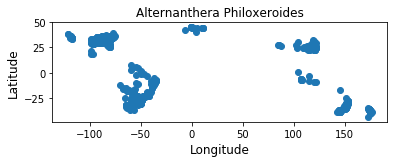

In [27]:
sample.plot()
plt.title('Alternanthera Philoxeroides', fontsize =12)
plt.xlabel('Longitude', size =12)
plt.ylabel('Latitude', size =12)

<p style='text-align: justify;'><b>Points to be noted is that subsampling reduces the number of records, and it cannot correct the data for areas that have not been sampled at all. It suffers from the problem that locally dense records might be a true reflection of the relative suitable of habitat.</b></p>

In [28]:
sample.to_file('alty_gbif_subsamp.shp')

In [29]:
sample=gpd.read_file('alty_gbif_subsamp.shp')

In [30]:
len(sample)

1091